# Lab 6: Logistic Regression

In this notebook we explore the sigmoid algorithm and we try to obtain the best model in order to predict wine types

#### Import necessary libraries

In [2]:
import math
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('wine_data.csv')

#### Data exploration

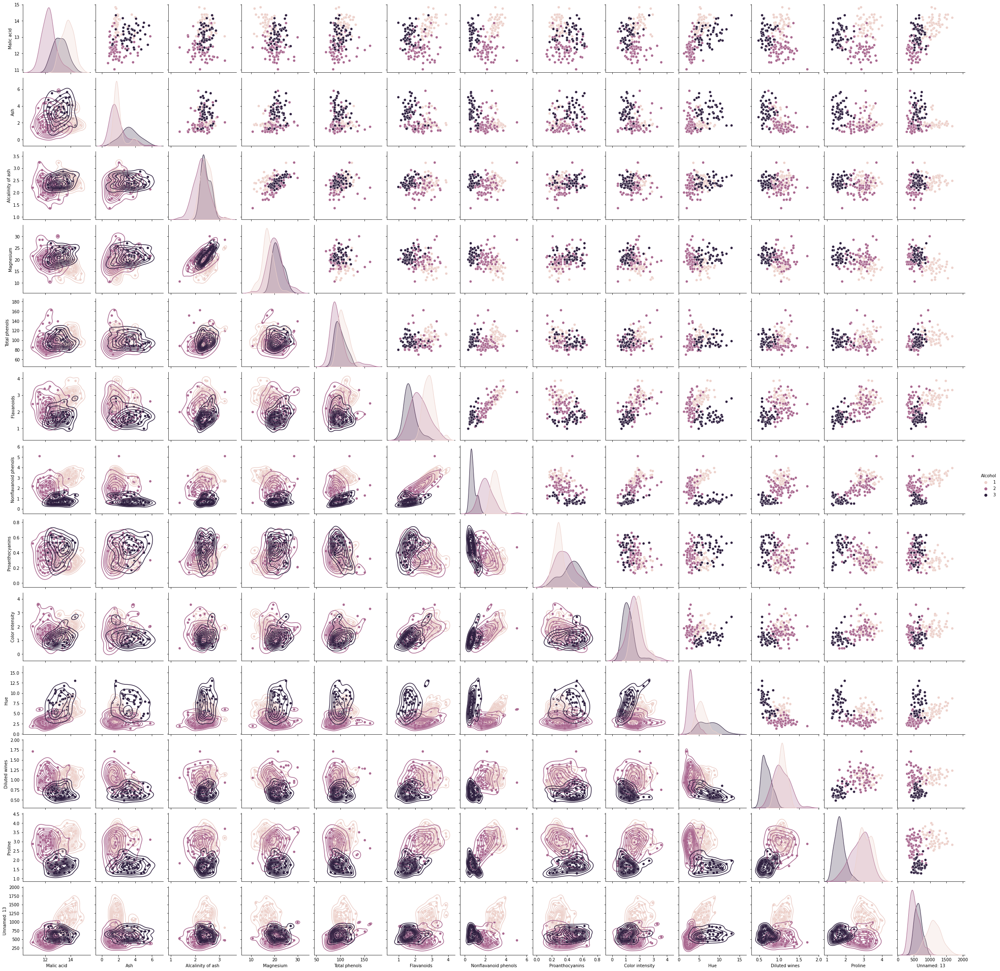

In [4]:
graph = sns.pairplot(df, hue="Alcohol")
graph.map_lower(sns.kdeplot)
graph.map_upper(sns.scatterplot)
plt.show()

Thanks to this information we can determine the variables to include in our analysis. The criteria to choose one feature is that the correlation between the target variable and the feature must be strong and describe a visible pattern between wine types

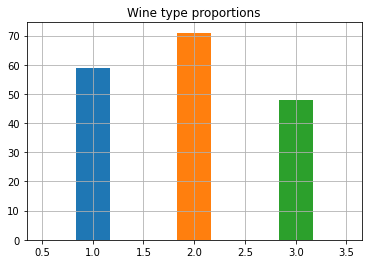

In [5]:
df.groupby('Alcohol')['Alcohol'].hist(bins=3)
plt.title('Wine type proportions')
plt.show()

The chosen independent variables are:
* Malic acid
* Flavanoids
* Nonflavanoid phenols
* Proanthocyanins
* Hue

The dependent variable is:
* Alcohol

#### Sigmoid implementation

In [6]:
def reg_cost(X, y, theta):
    x_hat = X @ theta
    h = 1 / (1 + np.exp(-x_hat))
    return -(y * np.log(h)) + ((1 - y) * np.log(1 - h))

def reg_cost_prime(X, y, theta):
    h = X @ theta
    return ((X.T @ (h-y)) / len(X))

def gradient_descent(
    X, y, theta_0, 
    cost_function, cost_function_prime,
    learning_rate, threshold, max_iter=1000
):
    theta = theta_0
    iteration = 0
    costs = []
    thetas = []

    while np.linalg.norm(cost_function_prime(X, y, theta)) > threshold and iteration < max_iter:
        iteration += 1
        theta -= learning_rate * cost_function_prime(X, y, theta)
        costs.append(cost_function(X, y, theta))
        thetas.append(theta.copy())
    return theta, costs, thetas

#### Adjust the data

In [7]:
# shuffle
df = df.sample(frac=1)
df.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,Diluted wines,Proline,Unnamed: 13
42,1,13.88,1.89,2.59,15.0,101,3.25,3.56,0.17,1.70,5.43,0.88,3.56,1095
20,1,14.06,1.63,2.28,16.0,126,3.00,3.17,0.24,2.10,5.65,1.09,3.71,780
118,2,12.77,3.43,1.98,16.0,80,1.63,1.25,0.43,0.83,3.40,0.70,2.12,372
123,2,13.05,5.80,2.13,21.5,86,2.62,2.65,0.30,2.01,2.60,0.73,3.10,380
98,2,12.37,1.07,2.10,18.5,88,3.52,3.75,0.24,1.95,4.50,1.04,2.77,660


In [17]:
df['ones'] = np.ones(len(df))
X = np.array(df.loc[:, ['ones', 'Malic acid', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].copy())
y = np.array(df.loc[:, ['Alcohol']].copy())

#### Split train, test and cross validation

In [18]:
# 70% train, 15% test, 15% cv
X_train = X[:124]
X_cv = X[125:150]
X_test = X[151:178]
y_train = y[:124]
y_cv = y[125:150]
y_test = y[151:178]

In [19]:
m, n = X.shape
theta_0 = np.random.rand(n, 1)

#### Try different models (by polynomial degree)

The criteria to choose the best model is going to be the lowest cost

Polynomial degree 1

In [56]:
r_theta_tr, costs_tr, thetas_tr = gradient_descent(X_train, y_train, theta_0, reg_cost, reg_cost_prime, 0.0000001, 0.01)
r_theta_tr

array([[ 0.29691335],
       [-0.12578351],
       [ 0.86796522],
       [ 0.70805418],
       [ 0.33579173],
       [-0.0210442 ]])

In [57]:
print(f'Train cost: {costs_tr[-1][-1][0]}')

Train cost: 3.367952685981017


In [58]:
print(f'Test cost: {reg_cost(X_test, y_test, r_theta_tr)[-1][0]} \ncv cost: {reg_cost(X_cv, y_cv, r_theta_tr)[-1][0]}')

Test cost: 3.365441164675641 
cv cost: 3.392735515911573


This model has an acceptable cost in all train, test and cross validation checks

Polynomial degree 2

In [61]:
r_theta_tr2, costs_tr2, thetas_tr2 = gradient_descent(X_train ** 2, y_train, theta_0, reg_cost, reg_cost_prime, 0.0000000001, 0.01)
r_theta_tr2

array([[ 0.29752612],
       [-0.04548051],
       [ 0.85624457],
       [ 0.68864564],
       [ 0.33614225],
       [ 0.02222999]])

In [62]:
print(f'Train cost: {costs_tr2[-1][-1][0]}')

Train cost: 12.58479311174896


In [63]:
print(f'Test cost: {reg_cost(X_test ** 2, y_test, r_theta_tr)[-1][0]} \ncv cost: {reg_cost(X_cv ** 2, y_cv, r_theta_tr)[-1][0]}')

Test cost: 9.10817921001379 
cv cost: 15.706944831254974


Compared to the first model, this is a higher cost and it behaves a little different between train, test and cross validation checks

Polynomial degree 3

In [45]:
r_theta_tr3, costs_tr3, thetas_tr3 = gradient_descent(X_train ** 3, y_train, theta_0, reg_cost, reg_cost_prime, 0.000000000001, 0.1)
r_theta_tr3

array([[ 0.30533021],
       [-0.0118592 ],
       [ 0.89778758],
       [ 0.74315987],
       [ 0.33760604],
       [ 0.01303325]])

In [46]:
print(f'Train cost: {costs_tr3[-1][-1][0]}')

Train cost: 59.49733844496656


In [64]:
print(f'Test cost: {reg_cost(X_test ** 3, y_test, r_theta_tr)[-1][0]} \ncv cost: {reg_cost(X_cv ** 3, y_cv, r_theta_tr)[-1][0]}')


Test cost: 205.26197166280713 
cv cost: 305.3989961815482


Compared to the first model and second, this model has a super high cost and it behaves very different between train, test and cross validation checks

## Conclusion

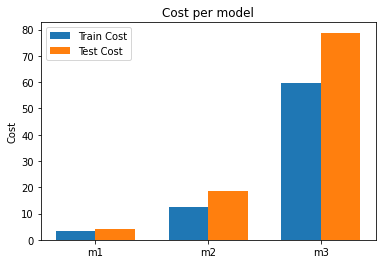

In [68]:
labels = ['m1', 'm2', 'm3']
TrainCost = [costs_tr[-1][-1][0], costs_tr2[-1][-1][0], costs_tr3[-1][-1][0]]
TestCost = [reg_cost(X_test, y_test, r_theta_tr)[-1][0], reg_cost(X_test, y_test, r_theta_tr)[-1][0] ** 2, reg_cost(X_test, y_test, r_theta_tr)[-1][0] ** 3]

x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, TrainCost, width, label='Train Cost')
rects2 = ax.bar(x + width/2, TestCost, width, label='Test Cost')

ax.set_ylabel('Cost')
ax.set_title('Cost per model')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.show()

As we saw earlier in each individual model, and now in the graph, the model with the lowest cost is <u>model 1</u> with a <strong>train cost of 3.36795</strong>, a <strong>test cost of 3.3654</strong> and a <strong>cross validation cost of 3.3927</strong>